# <span style='background-color: #fff5b1'>오늘의 한 걸음  🚶🏽‍♂️: 전력량 예측 AI 제작</span>

## Contexts

### 1. 준비 🕺
    1-1 Info of Contest 
    1-2 사용하는 라이브러리

### 2. 땅 🏃‍♀️
    2-1. 데이터 읽어오기  
    2-2. 데이터 전처리  
        -1. col 이름변경
        -2. New cloumns 생성
        -3. 군집화
        -4. Validation split
        
    2-3. 모델 학습
        -1. custmed MSE
        -2. model tuning
        -3. test에 parameter 저장
        -4. seed ansamble
        
    2-4. 데이터 평가
    2-5. Post-processing

---


# 1. 준비
## 1-1. Info of Contest 

인공지능 경진대회 사이트 [Dacon](https://dacon.io/) 에서는  
2021년 5월 한국전력공사에서 주관한 [전력사용량 예측 AI 경진대회](https://dacon.io/competitions/official/235736/overview/description)가 열렸습니다.

Dacon 에서는 익명의 60개 건물들의 전력 정보와 기후 정보를 제공합니다

제공 데이터
1. 건물번호
2. 기록시간 (1시간)
3. 전력사용량(kWh ; 시간 당 사용 키로와트)
4. 기온
5. 풍속
6. 습도
7. 강수량
8. 일조량
9. 비전기냉방성비 운영유무
10. 태양광 보유 유무

train 데이터는 2020년 6월 부터 8월 24일까지의 데이터를 담고 있습니다.  
test 데이터는 2020년 8월 25일부터  31일까지 총 일주일을 담고 있으며  
전력량데이터를 제외하고 3시간단위로 제공한다는 차이가 있습니다.

위의 데이터를 통해 건물의 전력량을 예측하는 모델을 제작해보도록 하겠습니다.


### 🏆명예의 전당
시작하기에 앞서 함께 진행해준  

[형주님](https://github.com/justin-on-it), [채은님](https://github.com/chaen805), [지은님](https://github.com/LumiHunter)께
감사의 말씀 드립니다!

## 1-2. 사용하는 라이브러리

In [152]:
import os #데이터 경로 라이브러리
import re # 정규표현식
import sys #시스템 관련 라이브러리

import pandas as pd
import numpy as np #배열 처리 라이브러리

import matplotlib.pyplot as plt
import seaborn as sns # 시각화 라이브러리

import sktime
import sklearn as skl #모델 생성 관련 라이브러리

from sktime.forecasting.model_selection import temporal_train_test_split #기간에 따른 데이터 분리 
from sktime.utils.plotting import plot_series 

import tqdm as tq
from tqdm import tqdm #progress 시각화 라이브러리

import xgboost as xgb
from xgboost import XGBRegressor #회귀 통계 라이브러리

import warnings
warnings.filterwarnings(action='ignore') #오류문 제어 라이브러리

print("-------------------------- Python & library version --------------------------")
print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("matplotlib version: {}".format(plt.__version__))
print("tqdm version: {}".format(tq.__version__))
print("sktime version: {}".format(sktime.__version__))
print("xgboost version: {}".format(xgb.__version__))
print("seaborn version: {}".format(sns.__version__))
print("scikit-learn version: {}".format(skl.__version__))
print("------------------------------------------------------------------------------")

-------------------------- Python & library version --------------------------
Python version: 3.9.7 | packaged by conda-forge | (default, Sep 29 2021, 19:20:46) 
[GCC 9.4.0]
pandas version: 1.3.3
numpy version: 1.21.4
matplotlib version: 3.4.3
tqdm version: 4.62.3
sktime version: 0.10.1
xgboost version: 1.4.2
seaborn version: 0.11.2
scikit-learn version: 1.0
------------------------------------------------------------------------------


# 2. 땅
## 2-1. 데이터 읽어오기

In [153]:
data_path = os.getenv('HOME')+'/aiffel/hackerton/train.csv' 
train = pd.read_csv(data_path, encoding='cp949') 
train.head()

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0


In [154]:
train.columns

Index(['num', 'date_time', '전력사용량(kWh)', '기온(°C)', '풍속(m/s)', '습도(%)',
       '강수량(mm)', '일조(hr)', '비전기냉방설비운영', '태양광보유'],
      dtype='object')

처음 고지대로 데이터가 정렬되어 있습니다.  
원활한 관리를 위해 열 이름을 영문으로 바꾸고,  
주어진 데이터를 가지고 유의미한 새로운 열을 생성하도록 하겠습니다.

## 2-2.데이터 전처리

### 2-2-1 columns 이름 변경

In [156]:
train_col = ['num', 'date_time', 'target', 'temp', 'wind', 'hum', 'rain', 'sunny', 'non_elec', 'solar']
train.columns = train_col
train.head()

,num,date_time,target,temp,wind,hum,rain,sunny,non_elec,solar
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0


In [164]:
test_path = os.getenv('HOME')+'/aiffel/hackerton/test.csv' 
test = pd.read_csv(test_path, encoding='cp949') 

test_col = ['num', 'date_time', 'temp', 'wind', 'hum', 'rain', 'sunny', 'non_elec', 'solar']
test.columns = test_col
test.head()

,num,date_time,temp,wind,hum,rain,sunny,non_elec,solar
0,1,2020-08-25 00,27.8,1.5,74.0,0.0,0.0,NaN,NaN
1,1,2020-08-25 01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,2020-08-25 02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,2020-08-25 03,27.3,1.1,78.0,NaN,0.0,NaN,NaN
4,1,2020-08-25 04,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [165]:
train_origin = train.copy()

In [166]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122400 entries, 0 to 122399
Data columns (total 10 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   num        122400 non-null  int64  
 1   date_time  122400 non-null  object 
 2   target     122400 non-null  float64
 3   temp       122400 non-null  float64
 4   wind       122400 non-null  float64
 5   hum        122400 non-null  float64
 6   rain       122400 non-null  float64
 7   sunny      122400 non-null  float64
 8   non_elec   122400 non-null  float64
 9   solar      122400 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 9.3+ MB


In [167]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10080 entries, 0 to 10079
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   num        10080 non-null  int64  
 1   date_time  10080 non-null  object 
 2   temp       3360 non-null   float64
 3   wind       3360 non-null   float64
 4   hum        3360 non-null   float64
 5   rain       1680 non-null   float64
 6   sunny      3360 non-null   float64
 7   non_elec   2296 non-null   float64
 8   solar      1624 non-null   float64
dtypes: float64(7), int64(1), object(1)
memory usage: 708.9+ KB


### 2-2-2 새로운 columns 생성

#### 날짜 데이터 생성

`data_time`을 기반으로 해당 데이터의 월/일/요일/시간 데이터를 분리하도록 하겠습니다.

전력량 소비는 월/일/요일/시간 에 따라 다른 연관성이 있으리라고 판단했습니다.

In [168]:
train['date_time'] = pd.to_datetime(train['date_time'])

train['month'] = train['date_time'].dt.month    # 월
train['day'] = train['date_time'].dt.day    # 일
train['weekday'] = train['date_time'].dt.weekday    # 요일
train['hour'] = train['date_time'].dt.hour    # 시간
train['dayofyear'] = train['date_time'].dt.dayofyear/232

train['holiday'] = train['weekday'].isin([5,6]).astype(int)    # 주말 구분


#### 공휴일 데이터 생성

6월부터 8월 사이에 있는 공휴일은 광복절의 대체공휴일인 8월 17일 하루입니다.   
주말이라는 특징은 전력량 소비와 연관이 있다고 판단 후 구분했습니다.

In [169]:
train.loc[(train['month'] == 8) & (train['day'] == 17), 'holiday'] = 1

#### 시간의 순환적 특징을 보존한 cos,sin 데이터 생성

기존의 hour 데이터는 0에서 23으로 오른 다음 날짜가 지나면 다시 0이 됩니다.  
하지만 23과 0은 엄밀히 23의 차이가 아닌 1의 차이를 가지지만 컴퓨터가 인식할 수 없습니다. 

때문에 시간 데이터를 24로 나눈 후 2파이를 곱해 사인코사인 함수를 씌워  
순환적인 특징을 보존하도록 변경했습니다.

In [170]:
train['sin_time'] = np.sin(2*np.pi*train.hour/24)
train['cos_time'] = np.cos(2*np.pi*train.hour/24)

#### 불쾌지수 THI 생성
습도와 온도로 정해지는 불쾌지수의 값은 냉방과 상관관계가 높다고 판단하여  
보존 데이터로 가공하여 생성하였습니다.

In [171]:
train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32

In [172]:
train.head()

,num,date_time,target,temp,wind,hum,rain,sunny,non_elec,solar,month,day,weekday,hour,dayofyear,holiday,sin_time,cos_time,THI
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0,6,1,0,0,0.659483,0,0.000000,1.000000,57.5376
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0,6,1,0,1,0.659483,0,0.258819,0.965926,57.0389
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0,6,1,0,2,0.659483,0,0.500000,0.866025,56.6789
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0,6,1,0,3,0.659483,0,0.707107,0.707107,55.9589
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0,6,1,0,4,0.659483,0,0.866025,0.500000,56.4576


#### 비전력냉방시설, 태양광, 월/일 데이터 제거
월/일 데이터는 공휴일을 제거하는데 사용하였고,  
태양열과 비전력냉방시설은 한 건물 내부의 전력량 고저와는 연관이 없다고 판단했습니다.
언제나 가동되기 때문입니다.  
이를 판단하기 위해 시각화를 진행했습니다.

비전기냉방시설 유무에 따른 시간당 전력사용량 분포
평균 
 non_elec
0.0    1868.722163
1.0    2536.198313
Name: target, dtype: float64
중앙값 
 non_elec
0.0    1308.960
1.0    1932.012
Name: target, dtype: float64
최댓값 
 non_elec
0.0     8827.704
1.0    17739.225
Name: target, dtype: float64


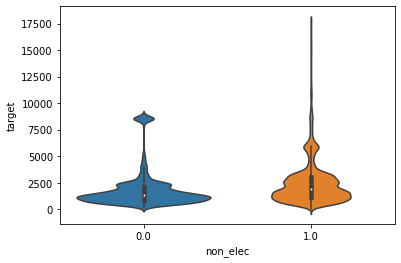

In [162]:
sns.violinplot(x="non_elec", y="target", data=train)
print('비전기냉방시설 유무에 따른 시간당 전력사용량 분포')
print('평균', '\n',train['target'].groupby(train['non_elec']).mean())
print('중앙값', '\n', train['target'].groupby(train['non_elec']).median())
print('최댓값', '\n', train['target'].groupby(train['non_elec']).max())

태양광시설 유무에 따른 시간당 전력사용량 분포
평균 
 solar
0.0    2093.135722
1.0    2572.504986
Name: target, dtype: float64
중앙값 
 solar
0.0    1431.7155
1.0    1889.6940
Name: target, dtype: float64
최댓값 
 solar
0.0     9331.200
1.0    17739.225
Name: target, dtype: float64


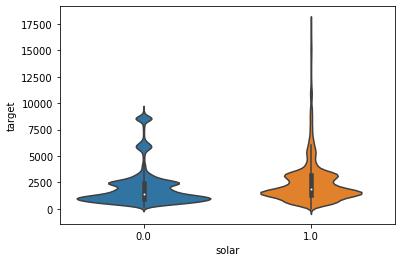

In [163]:
sns.violinplot(x='solar', y="target", data=train)
print('태양광시설 유무에 따른 시간당 전력사용량 분포')
print('평균', '\n',train['target'].groupby(train['solar']).mean())
print('중앙값', '\n',train['target'].groupby(train['solar']).median())
print('최댓값', '\n',train['target'].groupby(train['solar']).max())

비전기냉방시설을 운영(non_elec 1)하고 태양광을 보유(solar 1)한 건물의 전력 사용량이  
그렇지 않은 경우보다 적을 것으로 예상하였으나 실제로는 그렇지 않았습니다.     

시간당 전력 사용량을 시각화해본 결과,  
비전기냉방시설이나 태양광을 보유한 건물은  

시간당 전력 사용량이 급격히 높아지는 경우가 발생하고, 평균값과 중앙값 모두 높게 형성되어 있습니다.  


비전기냉방시설이나 태양광 시설 유무가  
건물의 총 전력 사용 규모에 영향을 주기보다  
많은 전력량을 사용하는 건물에 해당 시설을 갖추는 경우가 있는 것으로 보입니다.

따라서 'non_elec'과 'solar' 칼럼은 전력 사용 예측을 하는 데에 있어서는  
유의미한 변수가 아닐 것으로 판단했습니다.

In [161]:
train.groupby(['non_elec','solar'])['target'].mean()

non_elec  solar
0.0       0.0      2077.030506
          1.0      1582.298192
1.0       0.0      2101.993590
          1.0      2949.726621
Name: target, dtype: float64

In [173]:
train.drop(['non_elec', 'solar', 'month', 'day'], axis = 1, inplace = True)
train.head()

,num,date_time,target,temp,wind,hum,rain,sunny,weekday,hour,dayofyear,holiday,sin_time,cos_time,THI
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0,0,0.659483,0,0.000000,1.000000,57.5376
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0,1,0.659483,0,0.258819,0.965926,57.0389
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0,2,0.659483,0,0.500000,0.866025,56.6789
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0,3,0.659483,0,0.707107,0.707107,55.9589
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0,4,0.659483,0,0.866025,0.500000,56.4576


---

#### test Inference. 

test데이터에도 동일한 처리를 해 주었습니다.

In [174]:
test['date_time'] = pd.to_datetime(train['date_time'])

test['weekday'] = test['date_time'].dt.weekday    # 요일
test['hour'] = test['date_time'].dt.hour    # 시간
test['dayofyear'] = test['date_time'].dt.dayofyear/232

test['holiday'] = test['weekday'].isin([5,6]).astype(int)    # 주말 구분

test['sin_time'] = np.sin(2*np.pi*train.hour/24)
test['cos_time'] = np.cos(2*np.pi*train.hour/24)


test.drop(['non_elec', 'solar'], axis = 1, inplace = True)
test.head()

,num,date_time,temp,wind,hum,rain,sunny,weekday,hour,dayofyear,holiday,sin_time,cos_time
0,1,2020-06-01 00:00:00,27.8,1.5,74.0,0.0,0.0,0,0,0.659483,0,0.000000,1.000000
1,1,2020-06-01 01:00:00,NaN,NaN,NaN,NaN,NaN,0,1,0.659483,0,0.258819,0.965926
2,1,2020-06-01 02:00:00,NaN,NaN,NaN,NaN,NaN,0,2,0.659483,0,0.500000,0.866025
3,1,2020-06-01 03:00:00,27.3,1.1,78.0,NaN,0.0,0,3,0.659483,0,0.707107,0.707107
4,1,2020-06-01 04:00:00,NaN,NaN,NaN,NaN,NaN,0,4,0.659483,0,0.866025,0.500000


#### test데이터는 3시간 단위로 정보가 입력되어 있기 때문에 사잇값을 평균보간처리 하였습니다.

In [175]:
for i in range(60):
    test.iloc[i*168:(i+1)*168, 2:7]  = test.iloc[i*168:(i+1)*168, 2:7].interpolate()

In [176]:
test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32

In [102]:
test.head(30)

,num,date_time,temp,wind,hum,rain,sunny,weekday,hour,dayofyear,holiday,sin_time,cos_time,THI
0,1,2020-06-01 00:00:00,27.800000,1.500000,74.000000,0.0,0.000000,0,0,0.659483,0,0.000000e+00,1.000000e+00,66.710400
1,1,2020-06-01 01:00:00,27.633333,1.366667,75.333333,0.0,0.000000,0,1,0.659483,0,2.588190e-01,9.659258e-01,66.870933
2,1,2020-06-01 02:00:00,27.466667,1.233333,76.666667,0.0,0.000000,0,2,0.659483,0,5.000000e-01,8.660254e-01,67.066667
3,1,2020-06-01 03:00:00,27.300000,1.100000,78.000000,0.0,0.000000,0,3,0.659483,0,7.071068e-01,7.071068e-01,67.297600
4,1,2020-06-01 04:00:00,26.900000,1.166667,79.666667,0.0,0.000000,0,4,0.659483,0,8.660254e-01,5.000000e-01,67.290767
5,1,2020-06-01 05:00:00,26.500000,1.233333,81.333333,0.0,0.000000,0,5,0.659483,0,9.659258e-01,2.588190e-01,67.338933
6,1,2020-06-01 06:00:00,26.100000,1.300000,83.000000,0.0,0.000000,0,6,0.659483,0,1.000000e+00,6.123234e-17,67.442100
7,1,2020-06-01 07:00:00,27.000000,1.266667,81.000000,0.0,0.366667,0,7,0.659483,0,9.659258e-01,-2.588190e-01,68.080900
8,1,2020-06-01 08:00:00,27.900000,1.233333,79.000000,0.0,0.733333,0,8,0.659483,0,8.660254e-01,-5.000000e-01,68.798900
9,1,2020-06-01 09:00:00,28.800000,1.200000,77.000000,0.0,1.100000,0,9,0.659483,0,7.071068e-01,-7.071068e-01,69.596100


### 2-2-3. 데이터 군집화

데이터를 가공하면서,  
건물의 용도에 따라 전력량의 소모 패턴이 다르다는 것을 인지했습니다.  

예를 들어 회사 건물은 평일 낮에 전력소모량이 높은 반면,  
유흥업소는 주말이나 밤에 전력소모량이 높습니다

이를 제외해 어느정도의 유형이 있는지 시각화를 통해 확인해 봤습니다.

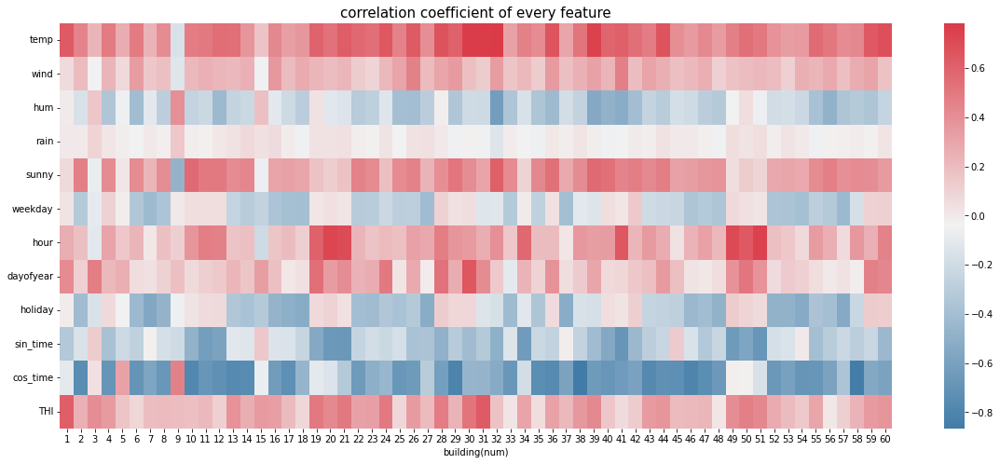

In [178]:


corr = []
for num in range(1,61):
    df = train[train.num==num]
    num_corr = df.corr()['target']
    num_corr = num_corr.drop(['num','target'])
    corr.append(num_corr)
corr_df = pd.concat(corr, axis=1).T
corr_df.index = list(range(1,61))

# 시각화
f, ax = plt.subplots(figsize=(20,8))
plt.title("correlation coefficient of every feature", fontsize=15)
sns.heatmap(corr_df.T, cmap=sns.diverging_palette(240,10,as_cmap=True), ax=ax)
plt.xlabel("building(num)")
plt.show()

일반적으로 주말('hoilday')에 전력 사용량이 음의 상관관계를 보일 것으로 예상되나,  
양의 상관관계를 보이는 건물이 존재하는 것을 확인했습니다.


또한 기온('temp')과 일조량('sunny')과 전력 사용량은  
일반적으로 양의 상관관계로 예측되나,  
양의 상관관계가 뚜렷하지 않거나 아예 음의 상관관계를 보이는 특이한 케이스도 존재했습니다.

* 특이케이스 9번 건물의 경우,  
  - 일조량과 확실한 음의 상관관계  
  - 기온과도 상관관계가 거의 없음
  - 습도와는 양의 상관관계

<AxesSubplot:xlabel='target', ylabel='Count'>

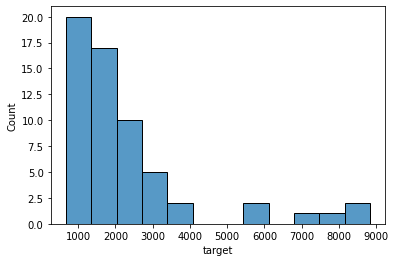

In [149]:
sns.histplot(train.groupby('num')['target'].mean())

건물당 전력 사용량의 평균 차이가 큽니다. 
건물별 전력사용량을 평균, 표준편차, 왜도를 기준으로 살펴봤습니다.

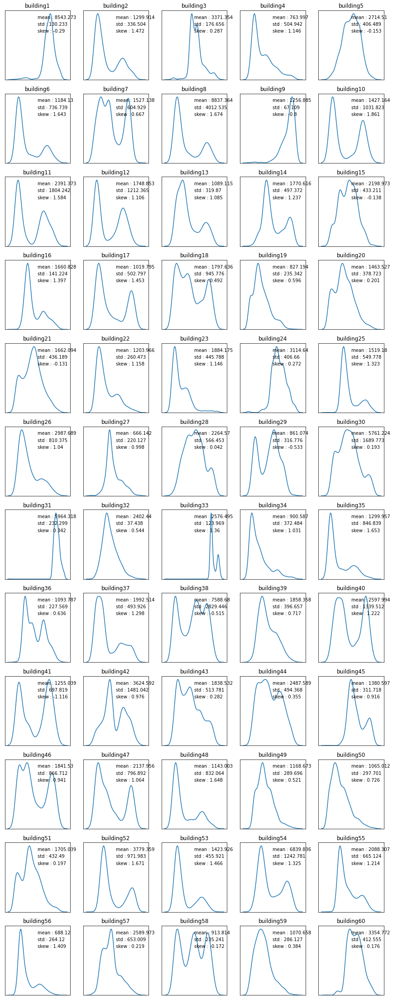

In [150]:

fig = plt.figure(figsize = (15, 40))
for num in range(1,61):
    ax = plt.subplot(12, 5, num)
    energy = train.loc[train.num == num, 'target'].values
    mean = energy.mean().round(3)
    std = energy.std().round(3)
    skew = (3*(mean - np.median(energy))/energy.std()).round(3)
    sns.kdeplot(energy)
    plt.title(f'building{num}')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.text(0.5, 0.9, f'mean : {mean}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.5, 0.8, f'std : {std}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.5, 0.7, f'skew : {skew}',  ha='left', va='center', transform=ax.transAxes)

한 쪽으로 쏠려있는 데이터가 많이 보여 이를 log 변환 후 확인했습니다.

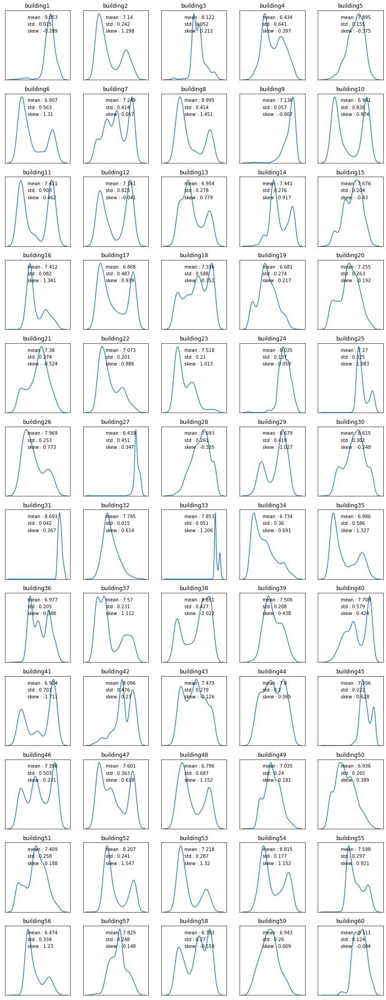

In [104]:
fig = plt.figure(figsize = (15, 40))
for num in range(1,61):
    ax = plt.subplot(12, 5, num)
    energy = np.log(1+train.loc[train.num == num, 'target'].values)
    mean = energy.mean().round(3)
    std = energy.std().round(3)
    skew = (3*(mean - np.median(energy))/energy.std()).round(3)
    sns.kdeplot(energy)
    plt.title(f'building{num}')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.text(0.35, 0.9, f'mean : {mean}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.8, f'std : {std}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.7, f'skew : {skew}',  ha='left', va='center', transform=ax.transAxes)

그 변환 이후에도 크게 쏠림현상이 개선되지는 않았고,  
건물별로 전력 사용의 시간당 분포 그래프가 다양한 형태로 그려지고 있다는 점을 알 수 있었습니다.

때문에  
전력사용량은 건물의 특성에 따라 다른 추이를 보인다는 가정 하에 건물 군집화를 시도해 보았습니다.

In [105]:
by_weekday = train.groupby(['num','weekday'])['target'].median().reset_index().pivot('num','weekday','target').reset_index()
by_weekday

weekday,num,0,1,2,3,4,5,6
0,1,8565.588000,8552.628000,8567.2080,8574.336000,8562.996000,8535.780000,8521.5240
1,2,1261.008000,1304.100000,1303.7760,1318.356000,1300.050000,1074.546000,1056.7260
2,3,3369.363177,3351.834000,3381.4800,3382.668000,3374.500282,3260.736000,3250.8000
3,4,538.488000,547.992000,554.2560,582.984000,612.360000,602.640000,608.2560
4,5,2761.992000,2732.184000,2730.2400,2650.752000,2880.792000,2747.736000,2585.9520
5,6,1062.450000,1064.880000,1112.1300,1108.620000,998.460000,671.760000,629.9100
6,7,1605.420000,1737.166500,1729.2690,1749.195000,1732.001737,1019.061000,945.6345
7,8,7938.072844,8774.302500,8642.0880,8752.990500,8292.098871,5730.700500,5809.0905
8,9,1262.898000,1279.908000,1279.8000,1277.856000,1275.480000,1278.342000,1252.6380
9,10,652.328429,904.608000,837.5400,935.388000,1151.010000,991.278000,938.6280


건물별 요일에 따른 전력량의 중앙값('by_weekday'),  
시간에 따른 전력량의 중앙값('by_hour')을 구한 데이터프레임을 만들었습니다.

시간당 전력 사용량은 급격히 늘어나는 이상치가 발생하는 경우가 많아, 평균값이 아닌 중앙값을 택했습니다.

In [106]:
by_hour = train.groupby(['num','hour'])['target'].median().reset_index().pivot('num','hour','target').reset_index().drop('num', axis = 1)
by_hour

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,8546.472,8526.384,8515.368,8505.000,8498.520000,8458.344,8458.344,8480.376,8501.112,8541.936000,...,8600.256000,8607.384,8606.088000,8598.960,8576.2800,8586.000,8573.688000,8577.57600,8577.576,8558.784
1,1008.288,1001.160,993.708,987.876,983.988000,991.440,1111.644,1318.356,1612.872,1711.368000,...,1707.480000,1697.112,1693.224000,1622.268,1367.2800,1204.956,1124.604000,1078.92000,1039.068,1021.248
2,3274.884,3272.400,3262.896,3276.288,3291.300000,3293.244,3320.784,3341.196,3363.120,3373.380000,...,3388.338000,3385.152,3406.212000,3394.872,3334.1760,3295.512,3290.760000,3283.52400,3283.740,3327.588
3,372.816,355.104,344.304,335.232,309.312000,309.312,308.016,324.864,647.568,899.856000,...,1294.704000,1288.224,1236.384000,1121.472,917.5680,748.224,566.352000,479.52000,405.216,422.496
4,2999.808,2920.320,2919.888,2912.976,2890.080000,2407.104,2198.880,2095.200,2386.800,2557.008000,...,2630.880000,2667.600,2584.224000,2552.256,2344.8960,2788.992,3132.000000,3111.69600,3091.824,3013.200
5,636.660,607.500,596.700,588.600,586.980000,585.360,629.100,827.820,1320.300,2035.800000,...,2302.020000,2327.940,2210.220000,2017.440,1440.7200,1119.960,940.680000,799.20000,714.960,667.980
6,1432.404,1386.639,1330.749,863.622,683.397000,1085.481,1701.972,1949.184,2220.534,2338.551000,...,2342.277000,2354.184,2169.112438,2074.572,1699.2180,1381.455,1191.915000,1003.50900,810.486,1422.522
7,5731.965,5616.828,5628.654,5555.610,5554.062000,5599.404,6204.213,9181.926,12171.780,14048.001000,...,14762.952000,14470.065,14624.235000,13148.271,8993.5795,7802.226,7082.136000,6596.98200,6208.506,6000.948
8,1297.620,1289.952,1287.252,1281.528,1278.072000,1269.648,1256.040,1252.800,1242.648,1227.636000,...,1223.100000,1243.512,1264.248000,1281.096,1293.4080,1304.640,1304.100000,1306.47600,1304.964,1300.644
9,423.468,420.228,416.016,406.296,403.704000,397.548,426.708,484.380,718.308,1971.216000,...,2604.312000,2593.296,2566.080000,2558.952,2506.1400,1906.740,1047.816000,606.52800,484.704,444.852


In [107]:
df = pd.concat([by_weekday, by_hour], axis= 1)
columns = ['num'] + ['day'+str(i) for i in range(7)] + ['hour'+str(i) for i in range(24)]
df.columns = columns

In [108]:
df

,num,day0,day1,day2,day3,day4,day5,day6,hour0,hour1,...,hour14,hour15,hour16,hour17,hour18,hour19,hour20,hour21,hour22,hour23
0,1,8565.588000,8552.628000,8567.2080,8574.336000,8562.996000,8535.780000,8521.5240,8546.472,8526.384,...,8600.256000,8607.384,8606.088000,8598.960,8576.2800,8586.000,8573.688000,8577.57600,8577.576,8558.784
1,2,1261.008000,1304.100000,1303.7760,1318.356000,1300.050000,1074.546000,1056.7260,1008.288,1001.160,...,1707.480000,1697.112,1693.224000,1622.268,1367.2800,1204.956,1124.604000,1078.92000,1039.068,1021.248
2,3,3369.363177,3351.834000,3381.4800,3382.668000,3374.500282,3260.736000,3250.8000,3274.884,3272.400,...,3388.338000,3385.152,3406.212000,3394.872,3334.1760,3295.512,3290.760000,3283.52400,3283.740,3327.588
3,4,538.488000,547.992000,554.2560,582.984000,612.360000,602.640000,608.2560,372.816,355.104,...,1294.704000,1288.224,1236.384000,1121.472,917.5680,748.224,566.352000,479.52000,405.216,422.496
4,5,2761.992000,2732.184000,2730.2400,2650.752000,2880.792000,2747.736000,2585.9520,2999.808,2920.320,...,2630.880000,2667.600,2584.224000,2552.256,2344.8960,2788.992,3132.000000,3111.69600,3091.824,3013.200
5,6,1062.450000,1064.880000,1112.1300,1108.620000,998.460000,671.760000,629.9100,636.660,607.500,...,2302.020000,2327.940,2210.220000,2017.440,1440.7200,1119.960,940.680000,799.20000,714.960,667.980
6,7,1605.420000,1737.166500,1729.2690,1749.195000,1732.001737,1019.061000,945.6345,1432.404,1386.639,...,2342.277000,2354.184,2169.112438,2074.572,1699.2180,1381.455,1191.915000,1003.50900,810.486,1422.522
7,8,7938.072844,8774.302500,8642.0880,8752.990500,8292.098871,5730.700500,5809.0905,5731.965,5616.828,...,14762.952000,14470.065,14624.235000,13148.271,8993.5795,7802.226,7082.136000,6596.98200,6208.506,6000.948
8,9,1262.898000,1279.908000,1279.8000,1277.856000,1275.480000,1278.342000,1252.6380,1297.620,1289.952,...,1223.100000,1243.512,1264.248000,1281.096,1293.4080,1304.640,1304.100000,1306.47600,1304.964,1300.644
9,10,652.328429,904.608000,837.5400,935.388000,1151.010000,991.278000,938.6280,423.468,420.228,...,2604.312000,2593.296,2566.080000,2558.952,2506.1400,1906.740,1047.816000,606.52800,484.704,444.852


In [109]:
for i in range(len(df)):
    # 요일 별 전력 중앙값에 대해 scaling
    df.iloc[i,1:8] = (df.iloc[i,1:8] - df.iloc[i,1:8].mean())/df.iloc[i,1:8].std()
    # 시간대별 전력 중앙값에 대해 scaling
    df.iloc[i,8:] = (df.iloc[i,8:] - df.iloc[i,8:].mean())/df.iloc[i,8:].std()
    
df

,num,day0,day1,day2,day3,day4,day5,day6,hour0,hour1,...,hour14,hour15,hour16,hour17,hour18,hour19,hour20,hour21,hour22,hour23
0,1,0.590985,-0.087195,0.675757,1.048756,0.455349,-0.968828,-1.714825,-0.054554,-0.495728,...,1.126655,1.283201,1.254738,1.098192,0.600092,0.813564,0.543166,0.628555,0.628555,0.215843
1,2,0.259920,0.635967,0.633139,0.760373,0.600624,-1.367257,-1.522765,-1.031987,-1.053854,...,1.112910,1.081104,1.069177,0.851507,0.069285,-0.428673,-0.675167,-0.815311,-0.937564,-0.992230
2,3,0.530408,0.226509,0.740475,0.761071,0.619469,-1.352837,-1.525096,-1.199306,-1.253455,...,1.273898,1.204446,1.663537,1.416334,0.093211,-0.749632,-0.853222,-1.010961,-1.006252,-0.050402
3,4,-1.280487,-0.973568,-0.771281,0.156449,1.105105,0.791211,0.972572,-0.904856,-0.950505,...,1.471105,1.454404,1.320798,1.024638,0.499121,0.062674,-0.406060,-0.629851,-0.821353,-0.776817
4,5,0.378345,0.055196,0.034121,-0.827608,1.666255,0.223795,-1.530104,0.966190,0.691945,...,-0.306662,-0.179973,-0.467631,-0.577925,-1.293345,0.238846,1.422270,1.352218,1.283657,1.012394
5,6,0.541930,0.553614,0.780809,0.763932,0.234243,-1.336649,-1.537878,-0.949362,-0.989268,...,1.329698,1.365170,1.204069,0.940248,0.151001,-0.287962,-0.533308,-0.726925,-0.842208,-0.906500
6,7,0.286375,0.653087,0.631105,0.686568,0.638711,-1.345733,-1.550113,-0.462087,-0.541157,...,1.109933,1.130505,0.810750,0.647409,-0.001103,-0.550113,-0.877588,-1.203104,-1.536597,-0.479161
7,8,0.171590,0.788874,0.691276,0.773142,0.432923,-1.457836,-1.399970,-1.001723,-1.030578,...,1.261556,1.188155,1.226792,0.856896,-0.184322,-0.482890,-0.663354,-0.784939,-0.882296,-0.934313
8,9,-0.903196,0.710699,0.700452,0.516007,0.290574,0.562118,-1.876656,0.974633,0.737176,...,-1.333049,-0.700944,-0.058807,0.462930,0.844199,1.192024,1.175301,1.248879,1.202057,1.068278
9,10,-1.740020,-0.074077,-0.516965,0.129180,1.553053,0.498253,0.150576,-0.966709,-0.969864,...,1.156468,1.145744,1.119247,1.112308,1.060892,0.477342,-0.358870,-0.788490,-0.907093,-0.945891


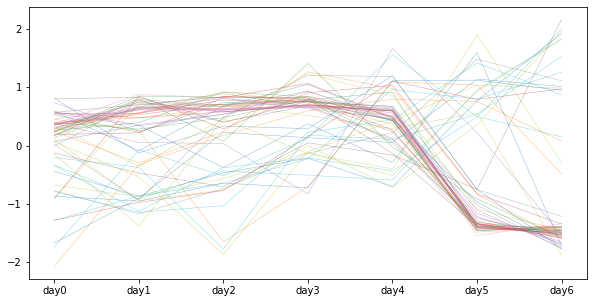

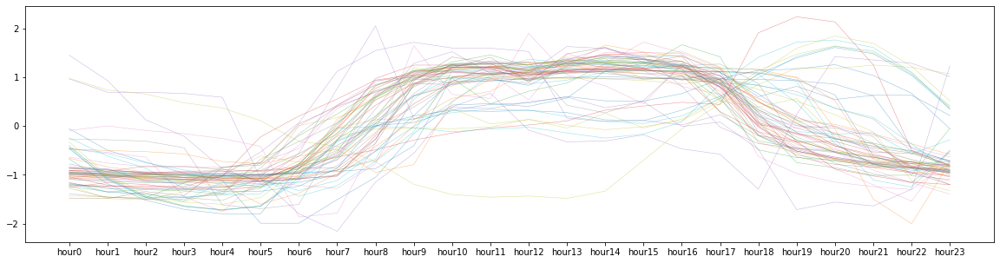

In [110]:
fig = plt.figure(figsize = (10,5))
for i in range(len(df)):
    plt.plot(df.iloc[i, 1:8], alpha = 0.5, linewidth = 0.5)
fig = plt.figure(figsize = (20,5))
for i in range(len(df)):
    plt.plot(df.iloc[i, 8:], alpha = 0.5, linewidth = 0.5)

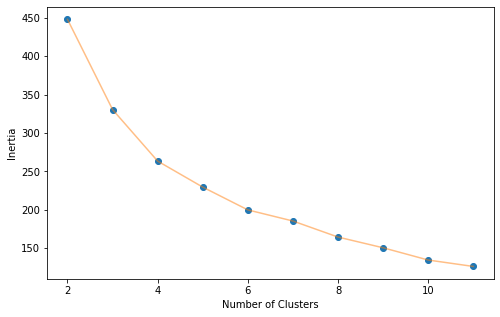

In [111]:
from sklearn.cluster import KMeans
def change_n_clusters(n_clusters, data):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(data)
        sum_of_squared_distance.append(kmeans.inertia_)
        
    plt.figure(1 , figsize = (8, 5))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11], df.iloc[:,1:])

시각화 결과, 예상대로 건물에 유형이 있었고,

1. 주말에 급격히 전력량이 떨어지는 유형
2. 주말에 전력량이 적당히 떨어지는 유형
3. 주말에 오히려 전력량이 높아지는 유형
4. 주말에 전력량이 적당히 높아지는 유형
5. 예외1
6. 예외2

의 경우로 구분하여 군집화를 구성했습니다.


In [112]:
kmeans = KMeans(n_clusters=5, random_state = 2)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])

In [113]:
df_clust = df.copy()
df_clust['km_cluster'] = km_cluster

df_clust

,num,day0,day1,day2,day3,day4,day5,day6,hour0,hour1,...,hour15,hour16,hour17,hour18,hour19,hour20,hour21,hour22,hour23,km_cluster
0,1,0.590985,-0.087195,0.675757,1.048756,0.455349,-0.968828,-1.714825,-0.054554,-0.495728,...,1.283201,1.254738,1.098192,0.600092,0.813564,0.543166,0.628555,0.628555,0.215843,0
1,2,0.259920,0.635967,0.633139,0.760373,0.600624,-1.367257,-1.522765,-1.031987,-1.053854,...,1.081104,1.069177,0.851507,0.069285,-0.428673,-0.675167,-0.815311,-0.937564,-0.992230,4
2,3,0.530408,0.226509,0.740475,0.761071,0.619469,-1.352837,-1.525096,-1.199306,-1.253455,...,1.204446,1.663537,1.416334,0.093211,-0.749632,-0.853222,-1.010961,-1.006252,-0.050402,4
3,4,-1.280487,-0.973568,-0.771281,0.156449,1.105105,0.791211,0.972572,-0.904856,-0.950505,...,1.454404,1.320798,1.024638,0.499121,0.062674,-0.406060,-0.629851,-0.821353,-0.776817,3
4,5,0.378345,0.055196,0.034121,-0.827608,1.666255,0.223795,-1.530104,0.966190,0.691945,...,-0.179973,-0.467631,-0.577925,-1.293345,0.238846,1.422270,1.352218,1.283657,1.012394,2
5,6,0.541930,0.553614,0.780809,0.763932,0.234243,-1.336649,-1.537878,-0.949362,-0.989268,...,1.365170,1.204069,0.940248,0.151001,-0.287962,-0.533308,-0.726925,-0.842208,-0.906500,4
6,7,0.286375,0.653087,0.631105,0.686568,0.638711,-1.345733,-1.550113,-0.462087,-0.541157,...,1.130505,0.810750,0.647409,-0.001103,-0.550113,-0.877588,-1.203104,-1.536597,-0.479161,4
7,8,0.171590,0.788874,0.691276,0.773142,0.432923,-1.457836,-1.399970,-1.001723,-1.030578,...,1.188155,1.226792,0.856896,-0.184322,-0.482890,-0.663354,-0.784939,-0.882296,-0.934313,4
8,9,-0.903196,0.710699,0.700452,0.516007,0.290574,0.562118,-1.876656,0.974633,0.737176,...,-0.700944,-0.058807,0.462930,0.844199,1.192024,1.175301,1.248879,1.202057,1.068278,2
9,10,-1.740020,-0.074077,-0.516965,0.129180,1.553053,0.498253,0.150576,-0.966709,-0.969864,...,1.145744,1.119247,1.112308,1.060892,0.477342,-0.358870,-0.788490,-0.907093,-0.945891,3


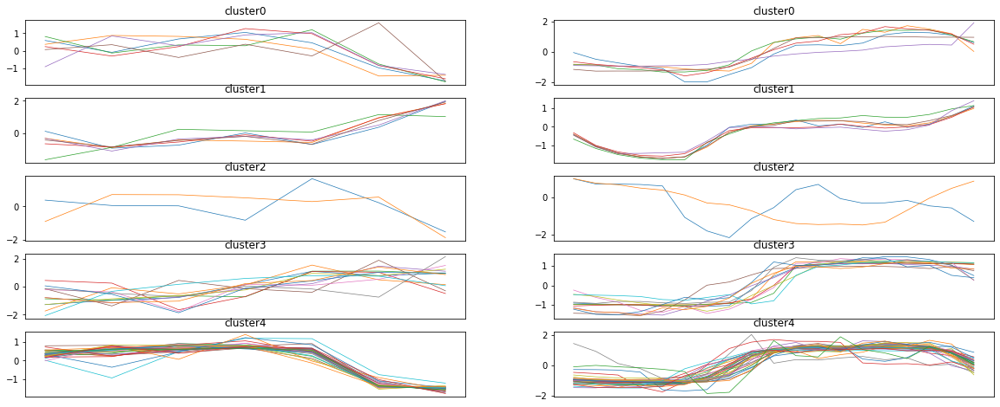

In [114]:
n_c = len(np.unique(df_clust.km_cluster)) 

fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

두 건물 5 & 9 는 경우가 특이해 별도 처리 하기로 판단했습니다.  

건물의 유형을 번호로 매겼고, 가장 많은 유형일 수록 가중치를 매겨 
새로운 칼럼을 생성했습니다. 

결과적으로 

- 사무실 유형 : 5
- 사무실 중간유형 : 4
- 유흥시설 유형 : 3
- 유흥시설 중간유형 : 2

- 건물 9번 : 1
- 건물 5번 : 0

입니다.

In [115]:
train = train.merge(df_clust[['num','km_cluster']], on = 'num', how = 'left')

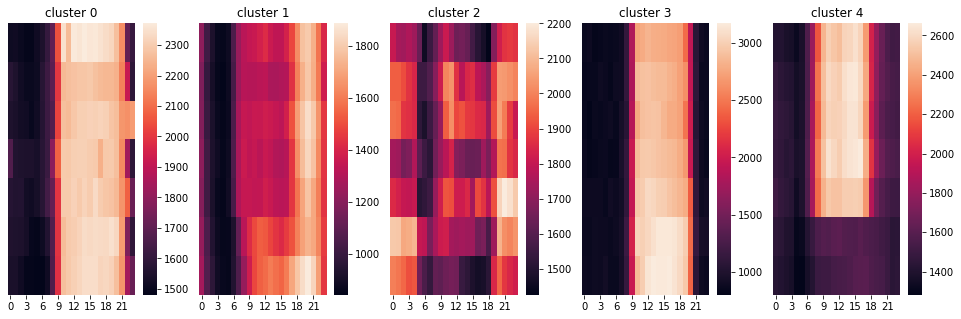

In [116]:
fig = plt.figure(figsize = (20, 5))
for c in range(5):
    temp = train[train.km_cluster == c]
    temp = temp.groupby(['weekday', 'hour'])['target'].median().reset_index().pivot('weekday', 'hour', 'target')
    plt.subplot(1, 6, c+1)
    sns.heatmap(temp)
    plt.title(f'cluster {c}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

In [117]:
train['km_cluster'] = train['km_cluster'].map({0:2, 1:3, 2:'temp', 3:4, 4:5})
train.loc[train['num'] == 5, 'km_cluster'] = 0
train.loc[train['num'] == 9, 'km_cluster'] = 1

In [118]:
train

,num,date_time,target,temp,wind,hum,rain,sunny,weekday,hour,dayofyear,holiday,sin_time,cos_time,THI,km_cluster
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0,0,0.659483,0,0.000000,1.000000,57.5376,2
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0,1,0.659483,0,0.258819,0.965926,57.0389,2
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0,2,0.659483,0,0.500000,0.866025,56.6789,2
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0,3,0.659483,0,0.707107,0.707107,55.9589,2
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0,4,0.659483,0,0.866025,0.500000,56.4576,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19:00:00,4114.368,27.8,2.3,68.0,0.0,0.7,0,19,1.021552,0,-0.965926,0.258819,65.0736,4
122396,60,2020-08-24 20:00:00,3975.696,27.3,1.2,71.0,0.0,0.0,0,20,1.021552,0,-0.866025,0.500000,64.9029,4
122397,60,2020-08-24 21:00:00,3572.208,27.3,1.8,71.0,0.0,0.0,0,21,1.021552,0,-0.707107,0.707107,64.9029,4
122398,60,2020-08-24 22:00:00,3299.184,27.1,1.8,74.0,0.0,0.0,0,22,1.021552,0,-0.500000,0.866025,65.4504,4


In [119]:
test

,num,date_time,temp,wind,hum,rain,sunny,weekday,hour,dayofyear,holiday,sin_time,cos_time,THI
0,1,2020-06-01 00:00:00,27.800000,1.500000,74.000000,0.0,0.000000,0,0,0.659483,0,0.000000,1.000000,66.710400
1,1,2020-06-01 01:00:00,27.633333,1.366667,75.333333,0.0,0.000000,0,1,0.659483,0,0.258819,0.965926,66.870933
2,1,2020-06-01 02:00:00,27.466667,1.233333,76.666667,0.0,0.000000,0,2,0.659483,0,0.500000,0.866025,67.066667
3,1,2020-06-01 03:00:00,27.300000,1.100000,78.000000,0.0,0.000000,0,3,0.659483,0,0.707107,0.707107,67.297600
4,1,2020-06-01 04:00:00,26.900000,1.166667,79.666667,0.0,0.000000,0,4,0.659483,0,0.866025,0.500000,67.290767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10075,60,2020-08-19 19:00:00,28.633333,3.566667,66.000000,0.0,0.533333,2,19,1.000000,0,-0.965926,0.258819,66.186400
10076,60,2020-08-19 20:00:00,28.266667,3.833333,67.000000,0.0,0.266667,2,20,1.000000,0,-0.866025,0.500000,65.710100
10077,60,2020-08-19 21:00:00,27.900000,4.100000,68.000000,0.0,0.000000,2,21,1.000000,0,-0.707107,0.707107,65.253600
10078,60,2020-08-19 22:00:00,27.900000,4.100000,68.000000,0.0,0.000000,2,22,1.000000,0,-0.500000,0.866025,65.253600


Test에도 동일한 처리를 해줍니다.

In [120]:
cluster = pd.concat([df_clust['num'], df_clust['km_cluster']], axis = 1, join = 'inner')
test = pd.merge(test, cluster)
test['km_cluster'] = test['km_cluster'].map({0:0, 1:1, 2:'temp', 3:2, 4:3})
test.loc[test['num'] == 5, 'km_cluster'] = 4
test.loc[test['num'] == 9, 'km_cluster'] = 5
test

,num,date_time,temp,wind,hum,rain,sunny,weekday,hour,dayofyear,holiday,sin_time,cos_time,THI,km_cluster
0,1,2020-06-01 00:00:00,27.800000,1.500000,74.000000,0.0,0.000000,0,0,0.659483,0,0.000000,1.000000,66.710400,0
1,1,2020-06-01 01:00:00,27.633333,1.366667,75.333333,0.0,0.000000,0,1,0.659483,0,0.258819,0.965926,66.870933,0
2,1,2020-06-01 02:00:00,27.466667,1.233333,76.666667,0.0,0.000000,0,2,0.659483,0,0.500000,0.866025,67.066667,0
3,1,2020-06-01 03:00:00,27.300000,1.100000,78.000000,0.0,0.000000,0,3,0.659483,0,0.707107,0.707107,67.297600,0
4,1,2020-06-01 04:00:00,26.900000,1.166667,79.666667,0.0,0.000000,0,4,0.659483,0,0.866025,0.500000,67.290767,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10075,60,2020-08-19 19:00:00,28.633333,3.566667,66.000000,0.0,0.533333,2,19,1.000000,0,-0.965926,0.258819,66.186400,2
10076,60,2020-08-19 20:00:00,28.266667,3.833333,67.000000,0.0,0.266667,2,20,1.000000,0,-0.866025,0.500000,65.710100,2
10077,60,2020-08-19 21:00:00,27.900000,4.100000,68.000000,0.0,0.000000,2,21,1.000000,0,-0.707107,0.707107,65.253600,2
10078,60,2020-08-19 22:00:00,27.900000,4.100000,68.000000,0.0,0.000000,2,22,1.000000,0,-0.500000,0.866025,65.253600,2


In [121]:
train['km_cluster']

0         2
1         2
2         2
3         2
4         2
         ..
122395    4
122396    4
122397    4
122398    4
122399    4
Name: km_cluster, Length: 122400, dtype: object

해당 가중치를 object 타입에서 int 타입으로 바꿔줍니다.  
회귀 모델에 학습하기 위해서입니다.


In [122]:
train = train.astype({'km_cluster':'int'})
test = test.astype({'km_cluster':'int'})

In [123]:
train['km_cluster']

0         2
1         2
2         2
3         2
4         2
         ..
122395    4
122396    4
122397    4
122398    4
122399    4
Name: km_cluster, Length: 122400, dtype: int64

### 2-2-4. Validation 데이터 생성

In [124]:
## 7번 건물의 발전량
y = train.loc[train.num == 7, 'target']
x = train.loc[train.num == 7, ].iloc[:, 3:]

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168
print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

train data shape
x:(1872, 13), y:(1872,)


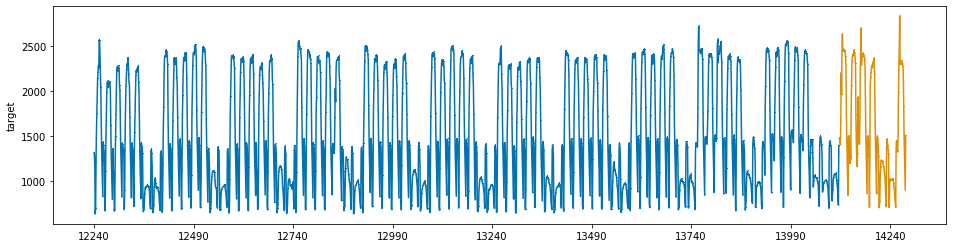

In [125]:
import matplotlib.pyplot as plt
plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

마지막 7일을 val 데이터로 분리해 검증한 뒤 test 값을 구분하기로 결정했습니다.

## 2-3.모델 학습

학습 모델로는 앙상블모델의 한 종류인 Xgboosting 모델을 사용하기로 했습니다.  
해당 모델은 GBM 모델보다 빠르며, 자동으로 가지치기 기법을 이용하기 때문에 과적합이 잘 일어나지 않습니다.  

손실함수로는 MSE 를 사용합니다.

### 2-3-1. Customed MSE

In [126]:
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

In [127]:
print("실제값이 100일 때 50으로 underestimate할 때의 SMAPE : {}".format(SMAPE(100, 50)))
print("실제값이 100일 때 150으로 overestimate할 때의 SMAPE : {}".format(SMAPE(100, 150)))

실제값이 100일 때 50으로 underestimate할 때의 SMAPE : 33.33333333333333
실제값이 100일 때 150으로 overestimate할 때의 SMAPE : 20.0


본 대회의 평가 matrix는 SMAPE 입니다.  
해당 지표는 위와 같이 과대예측보다 과소예측에 더 민감합니다.  

100인 결과보다 -50이면 SMAPE 가 33을 기록하지만,  
+50인 경우 SMAPE 가 20으로 훨씬 낮은 오차율을 보입니다.

허나 Xgb 의 기본 손실함수인 MSE 는 이러한 과소예측을 잡아줄 수 없기 때문에  
과소예측에 더 민감하게 반응해주는 Alpha 값을 가중치로 설정합니다. 

Alpha 값은 모델 튜닝을 통해 각 건물별로 할당하기로 결정했습니다.

In [128]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

기존 MSE 와  
우리가 제작한 custom MSE 를 썼을 때의 차이를 비교해 보겠습니다.  

다른 하이퍼파라미터는 고정 후, 7번 건물에 대한 예측을 시도해보았습니다.


In [129]:
xgb_path = os.getenv('HOME')+'/aiffel/hackerton/hyperparameter_xgb.csv' 
xgb_params = pd.read_csv(xgb_path)

xgb_reg = XGBRegressor(n_estimators = 10000, eta = xgb_params.iloc[47,1], min_child_weight = xgb_params.iloc[47,2], 
                       max_depth = xgb_params.iloc[47,3], colsample_bytree = xgb_params.iloc[47,4], 
                       subsample = xgb_params.iloc[47,5], seed=0)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=6, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=0,
             subsample=0.9, tree_method='exact', validate_parameters=1,
             verbosity=None)

best iterations: 739
SMAPE : 5.284170316931823


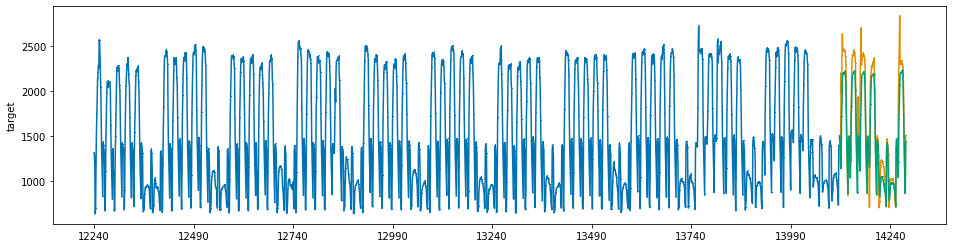

In [130]:
## 주황색이 실제 전력소비량, 초록색이 예측값입니다.

pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [131]:
xgb_reg = XGBRegressor(n_estimators = 10000, eta = xgb_params.iloc[47,1], min_child_weight = xgb_params.iloc[47,2], 
                       max_depth = xgb_params.iloc[47,3], colsample_bytree = xgb_params.iloc[47,4], 
                       subsample = xgb_params.iloc[47,5], seed=0)

xgb_reg.set_params(**{'objective':weighted_mse(100)})

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=6, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=4, num_parallel_tree=1,
             objective=<function weighted_mse.<locals>.weighted_mse_fixed at 0x7f5105075160>,
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=0, subsample=0.9, tree_method='exact', validate_parameters=1,
             verbosity=None)

best iterations: 634
SMAPE : 4.33668709533151


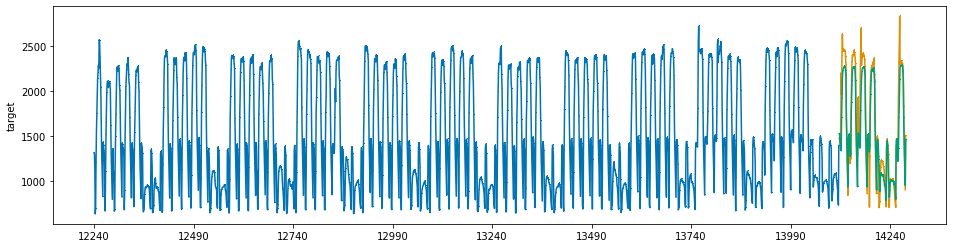

In [133]:
## SMAPE 값으로도, 그래프 상으로도 과소추정이 모델이 개선되었음을 확인
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

---

5.28에서 4.32 로 SMAPE 가 더 낮아졌음을 확인할 수 있습니다.

이후에는 각 건물별로 

1. n_estimator (앙상블모델 수)
2. Alpha 값

에 대해 적절한 tuning을 합니다.

### 2-3-2. model tuning

#### n_estimator

In [134]:
xgb_params = pd.read_csv(xgb_path)

In [135]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(60)):
    y = train.loc[train.num == i+1, 'target']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=0)
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

100%|██████████| 60/60 [03:21<00:00,  3.35s/it]


#### Alpha

In [136]:
alpha_list = []
smape_list = []
for i in tqdm(range(60)):
    y = train.loc[train.num == i+1, 'target']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
    
    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})
    
        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  2%|▏         | 1/60 [00:29<29:12, 29.71s/it]

building 1 || best score : 0.16192062386912384 || alpha : 7


  3%|▎         | 2/60 [00:48<22:21, 23.13s/it]

building 2 || best score : 1.4270523636517212 || alpha : 5


  5%|▌         | 3/60 [01:07<20:29, 21.58s/it]

building 3 || best score : 0.6351144585141572 || alpha : 10


  7%|▋         | 4/60 [01:26<18:51, 20.20s/it]

building 4 || best score : 9.137845069764463 || alpha : 7


  8%|▊         | 5/60 [01:43<17:39, 19.27s/it]

building 5 || best score : 3.5030507981119294 || alpha : 75


 10%|█         | 6/60 [02:06<18:30, 20.57s/it]

building 6 || best score : 2.915371204004688 || alpha : 100


 12%|█▏        | 7/60 [02:32<19:46, 22.39s/it]

building 7 || best score : 4.907688584407093 || alpha : 100


 13%|█▎        | 8/60 [02:52<18:39, 21.53s/it]

building 8 || best score : 2.9486502676887074 || alpha : 100


 15%|█▌        | 9/60 [03:20<20:03, 23.59s/it]

building 9 || best score : 3.065860913527135 || alpha : 75


 17%|█▋        | 10/60 [03:34<17:14, 20.70s/it]

building 10 || best score : 4.523019566780804 || alpha : 5


 18%|█▊        | 11/60 [03:42<13:37, 16.69s/it]

building 11 || best score : 2.3315940792903116 || alpha : 1


 20%|██        | 12/60 [03:53<11:59, 14.98s/it]

building 12 || best score : 2.366057059425676 || alpha : 1


 22%|██▏       | 13/60 [04:07<11:24, 14.55s/it]

building 13 || best score : 1.463304361193842 || alpha : 100


 23%|██▎       | 14/60 [04:20<10:49, 14.11s/it]

building 14 || best score : 1.7787979542661896 || alpha : 0


 25%|██▌       | 15/60 [04:27<08:56, 11.93s/it]

building 15 || best score : 3.631015378888159 || alpha : 3


 27%|██▋       | 16/60 [04:40<09:06, 12.43s/it]

building 16 || best score : 1.0547534811645487 || alpha : 1


 28%|██▊       | 17/60 [05:02<10:55, 15.25s/it]

building 17 || best score : 3.049137622807674 || alpha : 75


 30%|███       | 18/60 [05:47<17:00, 24.30s/it]

building 18 || best score : 4.5959240452191645 || alpha : 0


 32%|███▏      | 19/60 [06:05<15:19, 22.43s/it]

building 19 || best score : 4.306588030005581 || alpha : 100


 33%|███▎      | 20/60 [06:18<12:57, 19.43s/it]

building 20 || best score : 2.0601341013059176 || alpha : 10


 35%|███▌      | 21/60 [06:58<16:40, 25.65s/it]

building 21 || best score : 2.325564832756012 || alpha : 25


 37%|███▋      | 22/60 [07:22<15:56, 25.18s/it]

building 22 || best score : 3.3670972192069124 || alpha : 100


 38%|███▊      | 23/60 [07:58<17:27, 28.30s/it]

building 23 || best score : 4.62702096646679 || alpha : 100


 40%|████      | 24/60 [08:10<14:01, 23.37s/it]

building 24 || best score : 1.3836182445504062 || alpha : 100


 42%|████▏     | 25/60 [08:26<12:29, 21.41s/it]

building 25 || best score : 2.283984260756415 || alpha : 3


 43%|████▎     | 26/60 [08:44<11:23, 20.11s/it]

building 26 || best score : 1.9144310289737991 || alpha : 75


 45%|████▌     | 27/60 [09:07<11:35, 21.07s/it]

building 27 || best score : 5.619274451993974 || alpha : 7


 47%|████▋     | 28/60 [09:17<09:29, 17.81s/it]

building 28 || best score : 1.522493039111368 || alpha : 1


 48%|████▊     | 29/60 [09:24<07:34, 14.66s/it]

building 29 || best score : 2.9080261698156624 || alpha : 5


 50%|█████     | 30/60 [09:33<06:24, 12.80s/it]

building 30 || best score : 3.143166621816257 || alpha : 100


 52%|█████▏    | 31/60 [10:01<08:23, 17.38s/it]

building 31 || best score : 0.3897510973645279 || alpha : 50


 53%|█████▎    | 32/60 [10:17<07:58, 17.07s/it]

building 32 || best score : 0.21626212895253277 || alpha : 7


 55%|█████▌    | 33/60 [10:55<10:27, 23.25s/it]

building 33 || best score : 0.4519519561781729 || alpha : 10


 57%|█████▋    | 34/60 [11:01<07:47, 17.98s/it]

building 34 || best score : 5.115625966442997 || alpha : 3


 58%|█████▊    | 35/60 [11:28<08:43, 20.95s/it]

building 35 || best score : 5.801216296883868 || alpha : 100


 60%|██████    | 36/60 [11:48<08:14, 20.62s/it]

building 36 || best score : 2.311275082184503 || alpha : 100


 62%|██████▏   | 37/60 [12:19<09:04, 23.67s/it]

building 37 || best score : 2.5259711681386685 || alpha : 100


 63%|██████▎   | 38/60 [12:32<07:31, 20.51s/it]

building 38 || best score : 1.1926375969782184 || alpha : 25


 65%|██████▌   | 39/60 [12:46<06:26, 18.38s/it]

building 39 || best score : 3.3470791847191745 || alpha : 3


 67%|██████▋   | 40/60 [13:02<05:56, 17.83s/it]

building 40 || best score : 5.295426003812649 || alpha : 0


 68%|██████▊   | 41/60 [13:13<05:01, 15.87s/it]

building 41 || best score : 3.9234249068205753 || alpha : 75


 70%|███████   | 42/60 [13:24<04:16, 14.27s/it]

building 42 || best score : 5.21435025652016 || alpha : 10


 72%|███████▏  | 43/60 [13:34<03:41, 13.04s/it]

building 43 || best score : 2.9500612363388865 || alpha : 50


 73%|███████▎  | 44/60 [14:09<05:11, 19.48s/it]

building 44 || best score : 2.1073568749888922 || alpha : 1


 75%|███████▌  | 45/60 [14:30<05:01, 20.09s/it]

building 45 || best score : 2.3040240271062813 || alpha : 0


 77%|███████▋  | 46/60 [15:04<05:37, 24.08s/it]

building 46 || best score : 2.5763323267471105 || alpha : 75


 78%|███████▊  | 47/60 [15:31<05:25, 25.06s/it]

building 47 || best score : 2.167007407631966 || alpha : 0


 80%|████████  | 48/60 [15:50<04:38, 23.20s/it]

building 48 || best score : 5.658464022124556 || alpha : 75


 82%|████████▏ | 49/60 [16:09<04:03, 22.10s/it]

building 49 || best score : 3.175811315164384 || alpha : 100


 83%|████████▎ | 50/60 [16:50<04:37, 27.73s/it]

building 50 || best score : 3.020550448500279 || alpha : 75


 85%|████████▌ | 51/60 [17:04<03:32, 23.61s/it]

building 51 || best score : 1.808785173138374 || alpha : 10


 87%|████████▋ | 52/60 [17:16<02:39, 19.94s/it]

building 52 || best score : 1.307165373171026 || alpha : 10


 88%|████████▊ | 53/60 [17:36<02:19, 19.98s/it]

building 53 || best score : 2.2407101814552006 || alpha : 100


 90%|█████████ | 54/60 [17:55<01:58, 19.70s/it]

building 54 || best score : 1.384168793148717 || alpha : 100


 92%|█████████▏| 55/60 [18:13<01:37, 19.40s/it]

building 55 || best score : 1.6048598900585271 || alpha : 50


 93%|█████████▎| 56/60 [18:32<01:17, 19.31s/it]

building 56 || best score : 2.9278789894690056 || alpha : 100


 95%|█████████▌| 57/60 [19:01<01:05, 21.96s/it]

building 57 || best score : 5.161763174764586 || alpha : 100


 97%|█████████▋| 58/60 [19:09<00:35, 17.84s/it]

building 58 || best score : 1.8915916502476888 || alpha : 1


 98%|█████████▊| 59/60 [19:14<00:14, 14.10s/it]

building 59 || best score : 6.284889314677811 || alpha : 1


100%|██████████| 60/60 [19:27<00:00, 19.46s/it]

building 60 || best score : 1.768931654821549 || alpha : 3


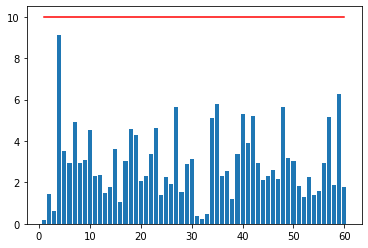

In [138]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,60], [10, 10], color = 'red')

### 2-3-3. 테스트 데이터에 하이퍼 파라미터 저장

tuning 과정에서 탐색한 하이퍼 파라미터 값들을 test 데이터에  
cloumns 으로 추가해줍니다. 모델 학습시 사용해 주기 위함입니다.

In [139]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,4,5,0.8,0.8,7,1041
1,100,0.01,6,3,0.8,0.9,5,794
2,100,0.01,6,7,0.9,0.9,10,531
3,100,0.01,3,7,0.8,0.9,7,438
4,100,0.01,2,6,0.9,0.9,75,502


추가한 데이터를 토대로 파일을 저장해 두었습니다.

In [140]:
xgb_params_final = os.getenv('HOME')+'/aiffel/hackerton/hyperparameter_xgb_final.csv' 
xgb_params = pd.read_csv(xgb_params_final)
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,4,5,0.8,0.8,100,1051
1,100,0.01,6,3,0.8,0.9,100,534
2,100,0.01,6,7,0.9,0.9,1,637
3,100,0.01,3,7,0.8,0.9,0,379
4,100,0.01,2,6,0.9,0.9,25,447


In [141]:
best_it = xgb_params['best_it'].to_list()
best_it[0]        # 1051

1051

### 2-3-4. 시드 앙상블
모델 seed 는 6개로 구분하여  
각 seed 별 모델 예측값의 평균을 구하기로 결정했습니다.

In [142]:
preds = np.array([]) 
for i in tqdm(range(60)):
    
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
    
    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = train.loc[train.num == i+1, 'target']
        x_train, x_test = train.loc[train.num == i+1, ].iloc[:, 3:], test.loc[test.num == i+1, ].iloc[:,1:]
        x_test = x_test[x_train.columns]
        
        xgb = XGBRegressor(seed = seed, n_estimators = best_it[i], eta = 0.01, 
                           min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                           colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])
    
        if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
        
        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
        
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)

100%|██████████| 60/60 [12:42<00:00, 12.72s/it]


## 2-4. 데이터 평가

완성된 XGb 모델을 바탕으로 test데이터를 예측한 결과입니다. 

In [143]:
preds = pd.Series(preds)

fig, ax = plt.subplots(60, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(60):
    train_y = train.loc[train.num == i+1, 'target'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.num == i+1, 'target'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
    
plt.show()

In [144]:
data_path_submission = os.getenv('HOME')+'/aiffel/hackerton/sample_submission.csv'
submission = pd.read_csv(data_path_submission)
submission['answer'] = preds
submission.to_csv(os.getenv('HOME')+'/aiffel/hackerton/fusion_submission_xgb_noclip2.csv', index = 'False')

## 2-5 데이터 후처리

SMAPE 값을 낮추기 위해, 예측한 test 값 중에서도  
train 의 마지막 4주 데이터 최솟값 보다 낮게 예측한 test 값들은
train 의 최솟값으로 변경해주었습니다.

In [145]:
data_path_post = os.getenv('HOME')+'/aiffel/hackerton/train.csv' 
train_to_post = pd.read_csv(data_path_post, encoding='cp949')
cols = ['num', 'date_time', 'target', 'temp', 'wind', 'hum' ,'prec', 'sun', 'non_elec', 'solar']
train_to_post.columns = cols
date = pd.to_datetime(train_to_post.date_time)
train_to_post['hour'] = date.dt.hour
train_to_post['day'] = date.dt.weekday
train_to_post['month'] = date.dt.month
train_to_post['week'] = date.dt.weekofyear
train_to_post = train_to_post.loc[(('2020-08-17'>train_to_post.date_time)|(train_to_post.date_time>='2020-08-18')), ].reset_index(drop = True)

pred_clip = []

data_path_test_post = os.getenv('HOME')+'/aiffel/hackerton/test.csv' 
test_to_post = pd.read_csv(data_path_test_post,  encoding = 'cp949')
cols = ['num', 'date_time', 'temp', 'wind', 'hum' ,'prec', 'sun', 'non_elec', 'solar']
test_to_post.columns = cols
date = pd.to_datetime(test_to_post.date_time)
test_to_post['hour'] = date.dt.hour
test_to_post['day'] = date.dt.weekday
test_to_post['month'] = date.dt.month
test_to_post['week'] = date.dt.weekofyear

## submission 불러오기

data_path_load_submission = os.getenv('HOME') + '/aiffel/hackerton/fusion_submission_xgb_noclip2.csv'
df = pd.read_csv(data_path_load_submission)

for i in range(60):
    min_data = train_to_post.loc[train_to_post.num == i+1, ].iloc[-28*24:, :] ## 건물별로 직전 28일의 데이터 불러오기
    ## 요일별, 시간대별 최솟값 계산
    min_data = pd.pivot_table(min_data, values = 'target', index = ['day', 'hour'], aggfunc = min).reset_index() 
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_to_post.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_to_post.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        min_power = min_data.loc[(min_data.day == df_pred.day[j])&(min_data.hour == df_pred.hour[j]), 'target'].values[0]
        if df_pred.pred[j] < min_power:
            pred_clip.append(min_power)
        else:
            pred_clip.append(df_pred.pred[j])

## 2-6. 최종결과

최종결과는 다음과 같습니다.

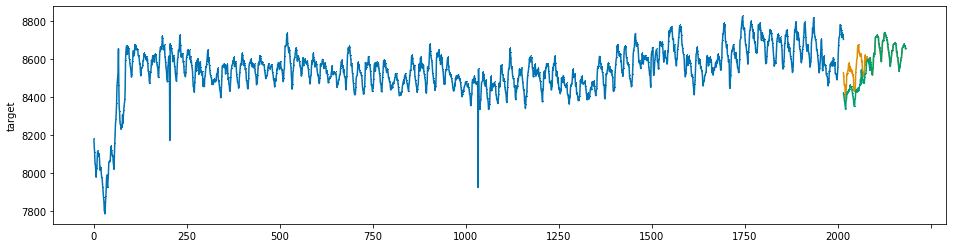

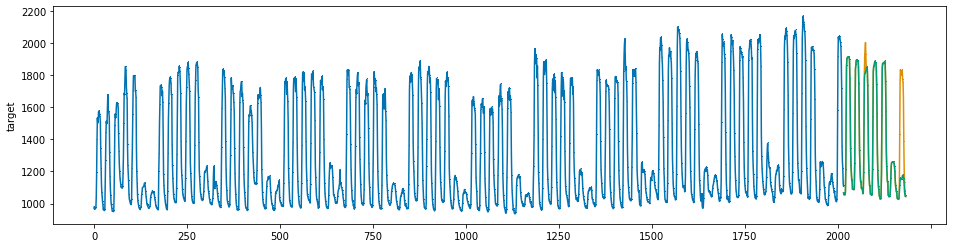

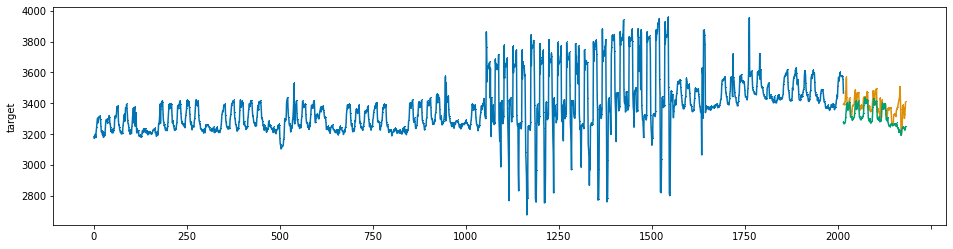

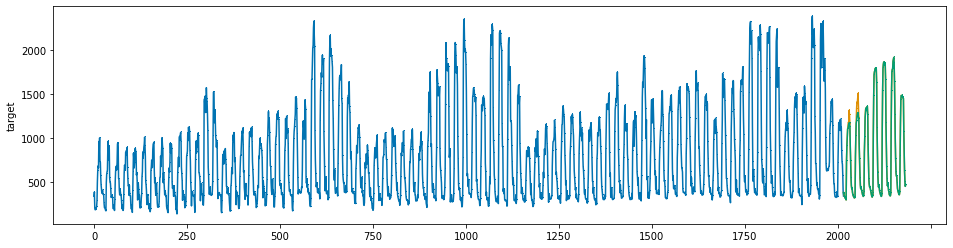

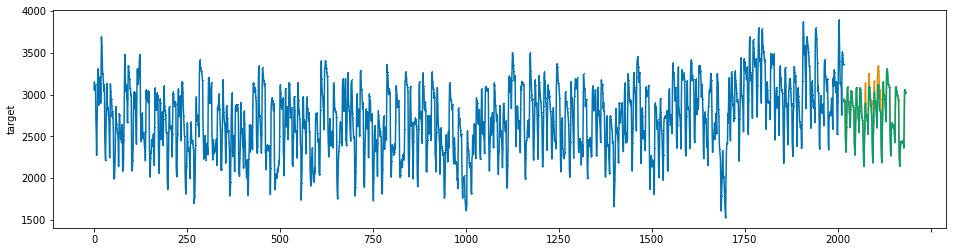

...

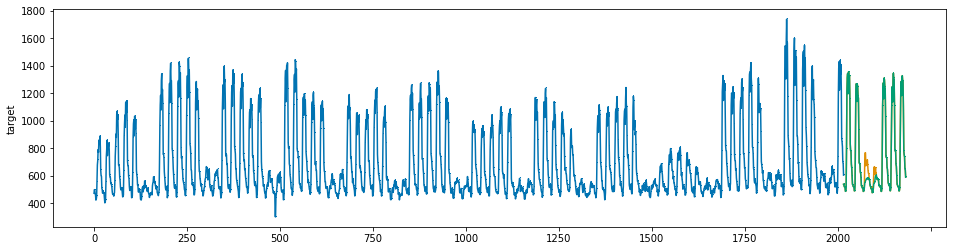

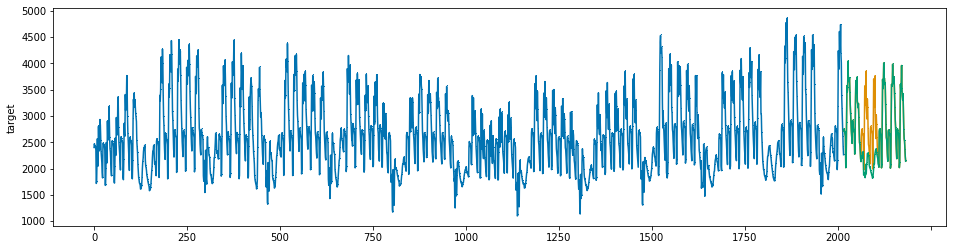

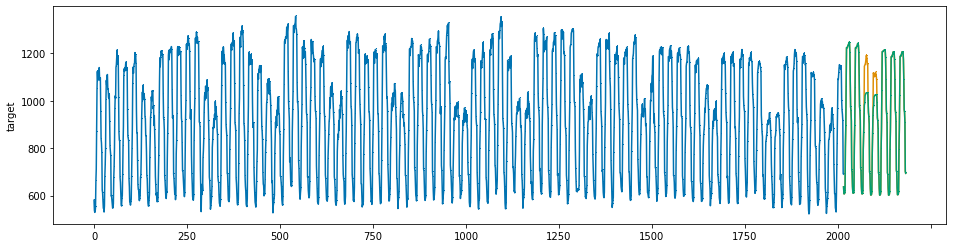

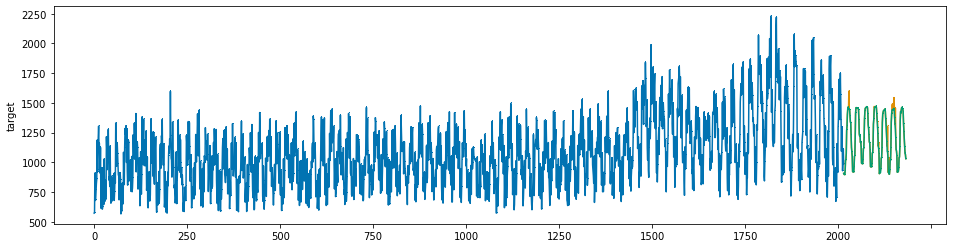

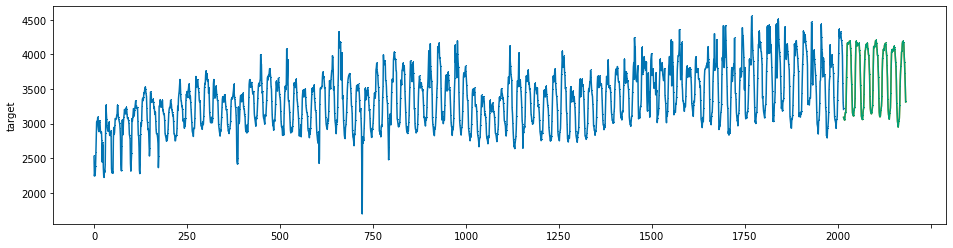

In [146]:
pred_origin = df.answer
pred_clip = pd.Series(pred_clip)

for i in range(60):
    target = train_to_post.loc[train_to_post.num == i+1, 'target'].reset_index(drop=True)
    preds = pred_clip[i*168:(i+1)*168]
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds.index = range(target.index[-1], target.index[-1]+168)
    preds_origin.index = range(target.index[-1], target.index[-1]+168)
    
    plot_series(target, preds,  preds_origin, markers = [',', ',', ','])

In [147]:
data_path_submission = os.getenv('HOME')+'/aiffel/hackerton/sample_submission.csv'
submission = pd.read_csv(data_path_submission)

submission['answer'] = pred_clip
submission.to_csv(os.getenv('HOME')+'/aiffel/hackerton/fusion_submission_xgb_final2.csv', index = False)

In [148]:
submission[['num_date_time','answer']]

,num_date_time,answer
0,1 2020-08-25 00,8528.328000
1,1 2020-08-25 01,8508.888000
2,1 2020-08-25 02,8466.768000
3,1 2020-08-25 03,8462.232000
4,1 2020-08-25 04,8462.232000
...,...,...
10075,60 2020-08-31 19,3986.038330
10076,60 2020-08-31 20,3879.435791
10077,60 2020-08-31 21,3715.572021
10078,60 2020-08-31 22,3531.227783


해당 결과를 바탕으로 Dacon에 제출하였으며,  
212등을 차지했습니다

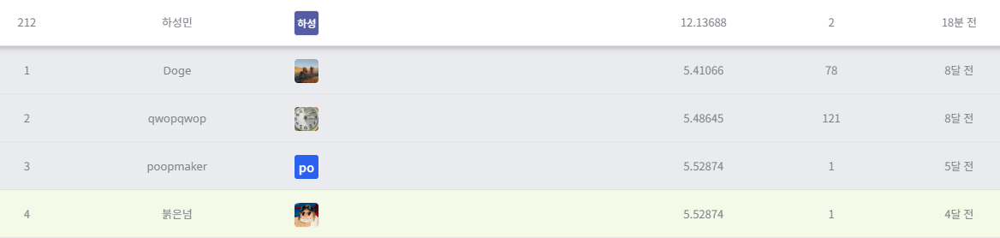